In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider
import pandas as pd
import sunpy
import sunpy.map
from sunpy.coordinates import (get_earth, get_horizons_coord,
                                Helioprojective, propagate_with_solar_surface)
import sunkit_image
import sunkit_image.coalignment as coalignment
import astropy
from astropy.coordinates import SkyCoord
from astropy.wcs import WCS
import astropy.units as u
import astropy.constants as const
import eispac

import cmcrameri.cm as cmcm
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.ticker import (AutoLocator, AutoMinorLocator, 
    FixedLocator, FixedFormatter, LogLocator, StrMethodFormatter)
from ipywidgets import interactive, widgets
from IPython.display import display, clear_output
from astropy.visualization import (AsinhStretch, LinearStretch,
        LogStretch, ImageNormalize)
import os
from sun_blinker import SunBlinker


In [2]:
def plot_colorbar(im, ax, width="3%", height="100%",loc="lower left",fontsize=14,
                  bbox_to_anchor=(1.02, 0., 1, 1),orientation="vertical"):
    clb_ax = inset_axes(ax,width=width,height=height,loc=loc,
                bbox_to_anchor=bbox_to_anchor,
                 bbox_transform=ax.transAxes,
                 borderpad=0)
    clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)
    clb_ax.yaxis.set_minor_locator(AutoMinorLocator(5))
    clb_ax.yaxis.get_offset_text().set_fontsize(fontsize)
    clb_ax.tick_params(labelsize=fontsize)
    return clb, clb_ax

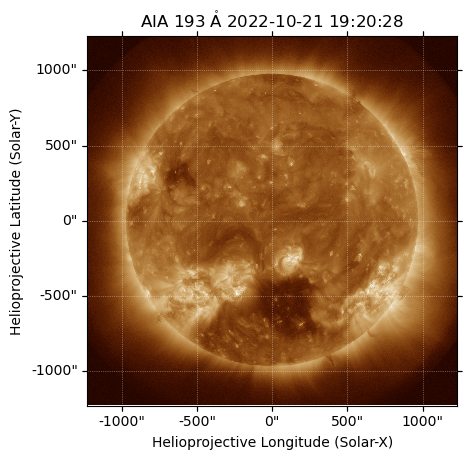

In [3]:
aia_193_map = sunpy.map.Map("../../src/AIA/20221021/193/lvl15/aia_lev15_193a_2022_10_21t19_20_28_84z_image_lev15.fits")
aia_193_map.plot()

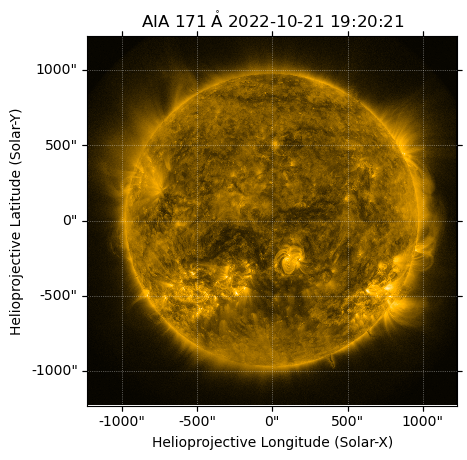

In [4]:
aia_171_map = sunpy.map.Map("../../src/AIA/20221021/171/lvl15/aia_lev15_171a_2022_10_21t19_20_21_35z_image_lev15.fits")
aia_171_map.plot()

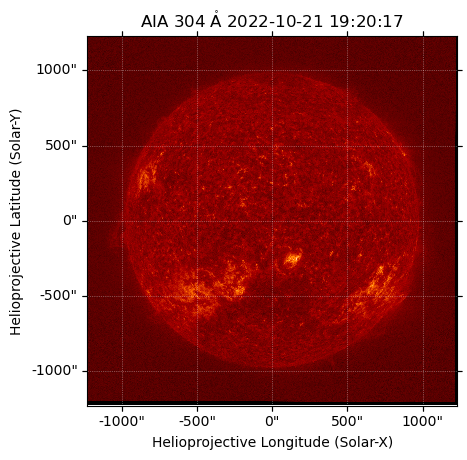

In [5]:
aia_304_map = sunpy.map.Map("../../src/AIA/20221021/304/lvl15/aia_lev15_304a_2022_10_21t19_20_17_13z_image_lev15.fits")
aia_304_map.plot()

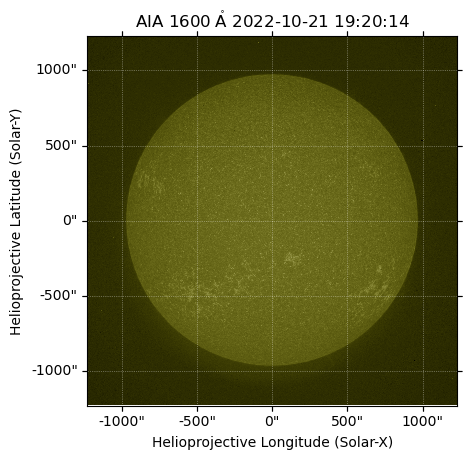

In [6]:
aia_1600_map = sunpy.map.Map("../../src/AIA/20221021/1600/lvl15/aia_lev15_1600a_2022_10_21t19_20_14_13z_image_lev15.fits")
aia_1600_map.plot()

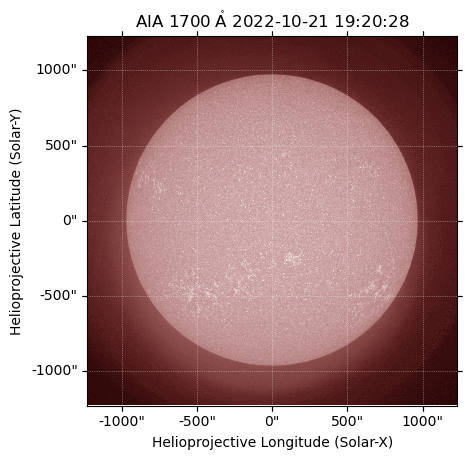

In [7]:
aia_1700_map = sunpy.map.Map("../../src/AIA/20221021/1700/lvl15/aia_lev15_1700a_2022_10_21t19_20_28_75z_image_lev15.fits")
aia_1700_map.plot()

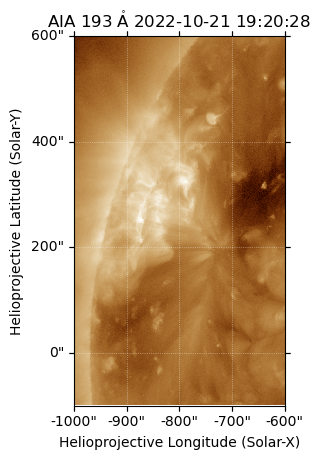

In [8]:
aia_193_map_crop = aia_193_map.submap(SkyCoord(-1000*u.arcsec,-100*u.arcsec,frame=aia_193_map.coordinate_frame),
                                        top_right=SkyCoord(-600*u.arcsec,600*u.arcsec,frame=aia_193_map.coordinate_frame))

aia_193_map_crop.plot()

In [9]:
aia_304_map_crop = aia_304_map.submap(SkyCoord(-1000*u.arcsec,-100*u.arcsec,frame=aia_304_map.coordinate_frame),
                                        top_right=SkyCoord(-600*u.arcsec,600*u.arcsec,frame=aia_304_map.coordinate_frame))

aia_171_map_crop = aia_171_map.submap(SkyCoord(-1000*u.arcsec,-100*u.arcsec,frame=aia_171_map.coordinate_frame),
                                        top_right=SkyCoord(-600*u.arcsec,600*u.arcsec,frame=aia_171_map.coordinate_frame))

aia_1600_map_crop = aia_1600_map.submap(SkyCoord(-1000*u.arcsec,-100*u.arcsec,frame=aia_1600_map.coordinate_frame),
                                        top_right=SkyCoord(-600*u.arcsec,600*u.arcsec,frame=aia_1600_map.coordinate_frame))

aia_1700_map_crop = aia_1700_map.submap(SkyCoord(-1000*u.arcsec,-100*u.arcsec,frame=aia_1700_map.coordinate_frame),
                                        top_right=SkyCoord(-600*u.arcsec,600*u.arcsec,frame=aia_1700_map.coordinate_frame))

In [10]:
def coalign_shift(big_map, small_map):
    yshift, xshift = coalignment._calculate_shift(big_map.data, small_map.data)
    reference_coord = big_map.pixel_to_world(xshift, yshift)
    Txshift = reference_coord.Tx - small_map.bottom_left_coord.Tx
    Tyshift = reference_coord.Ty - small_map.bottom_left_coord.Ty

    return Txshift, Tyshift
    

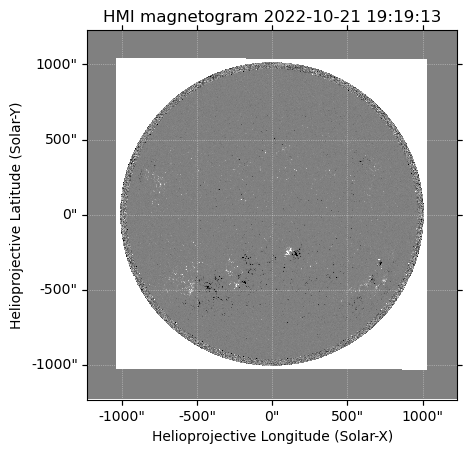

In [11]:
hmi_los_map = sunpy.map.Map("../../src/HMI/20221021/lvl15/hmi.M_45s.20221021_192015_TAI.2.magnetogram.fits")
hmi_los_map.plot_settings['norm'] = plt.Normalize(-500, 500)
hmi_los_map.plot()

In [12]:
hmi_los_map_to_aia = hmi_los_map.reproject_to(aia_193_map.wcs)

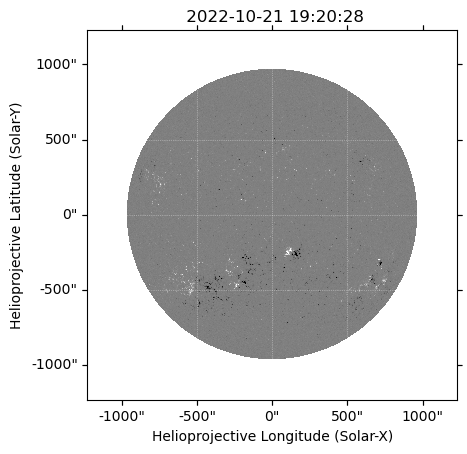

In [13]:
hmi_los_map_to_aia.plot()

In [14]:
hmi_los_map_to_aia_crop = hmi_los_map_to_aia.submap(SkyCoord(-1000*u.arcsec,-100*u.arcsec,frame=hmi_los_map_to_aia.coordinate_frame),
                                        top_right=SkyCoord(-600*u.arcsec,600*u.arcsec,frame=hmi_los_map_to_aia.coordinate_frame))

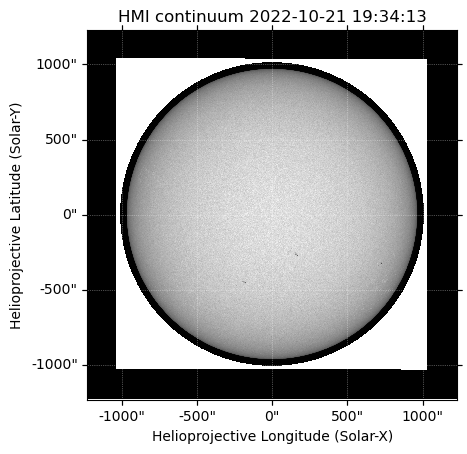

In [15]:
hmi_ic_map = sunpy.map.Map("../../src/HMI/20221021/lvl15/hmi.Ic_45s.20221021_193515_TAI.2.continuum.fits")
hmi_ic_map.plot()

In [16]:
hmi_ic_map_to_aia = hmi_ic_map.reproject_to(aia_193_map.wcs)

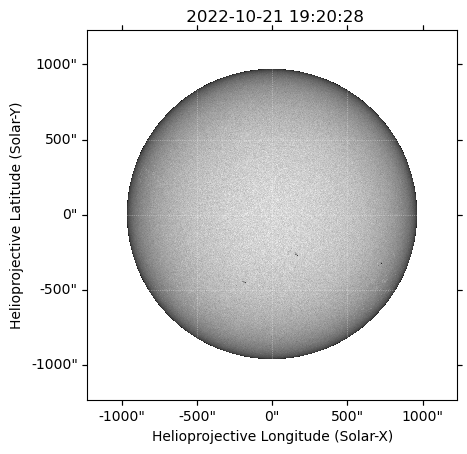

In [17]:
hmi_ic_map_to_aia.plot()

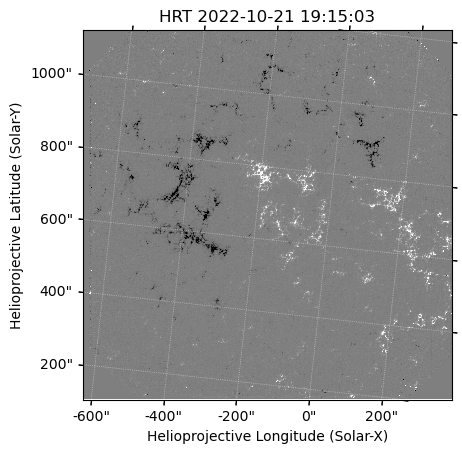

In [18]:
phi_los_map = sunpy.map.Map("../../src/PHI/20221021/solo_L2_phi-hrt-blos_20221021T191503_V01.fits")
phi_los_map.plot_settings['norm'] = plt.Normalize(-500, 500)
phi_los_map.plot()

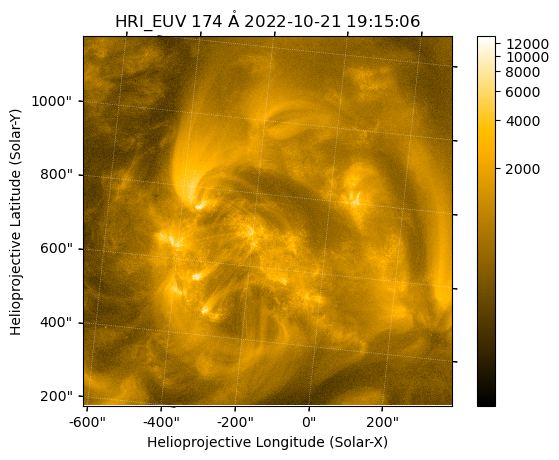

In [19]:
hri_174_map = sunpy.map.Map("../../src/EUI/HRI/euv174/20221021/solo_L2_eui-hrieuv174-image_20221021T191505221_V01.fits")
hri_174_map.plot()
plt.colorbar()

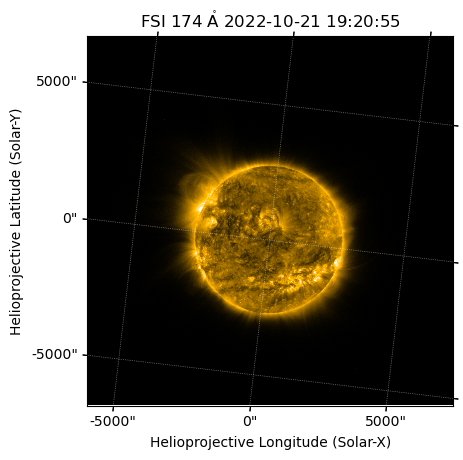

In [20]:
fsi_174_map = sunpy.map.Map("../../src/EUI/FSI/euv174/20221021/solo_L2_eui-fsi174-image_20221021T192050229_V01.fits")
fsi_174_map.plot()

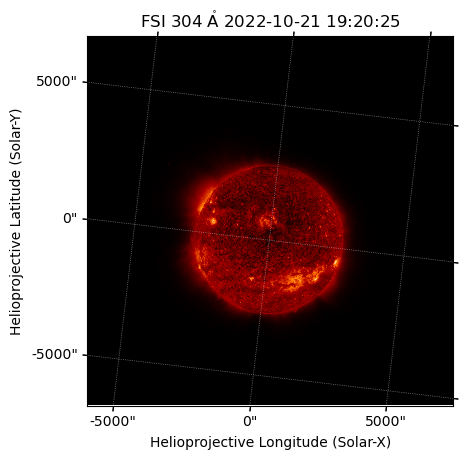

In [21]:
fsi_304_map = sunpy.map.Map("../../src/EUI/FSI/euv304/20221021/solo_L2_eui-fsi304-image_20221021T192020228_V01.fits")
fsi_304_map.plot()

In [22]:
def derotate_fsi(fsi_map, hri_map,algorithm="adaptive"):
    out_frame = hri_map.coordinate_frame
    out_center = SkyCoord(0*u.arcsec, 0*u.arcsec, frame=out_frame)
    header = sunpy.map.make_fitswcs_header(fsi_map.data.shape,
                                        out_center,
                                        scale=u.Quantity(fsi_map.scale),
                                        rotation_matrix=fsi_map.rotation_matrix)
    out_wcs = WCS(header)

    with propagate_with_solar_surface():
        fsi_map_derot = fsi_map.reproject_to(out_wcs,algorithm=algorithm)

    return fsi_map_derot


In [23]:
fsi_174_map_hri_time = derotate_fsi(fsi_174_map,hri_174_map)

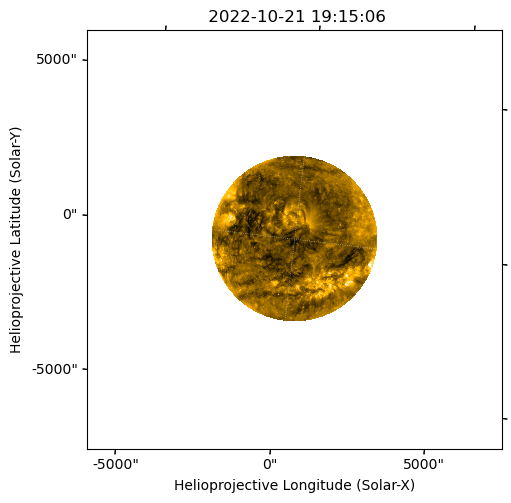

In [24]:
fig = plt.figure(figsize=(5,5),constrained_layout=True)

ax1 = fig.add_subplot(111,projection=fsi_174_map_hri_time)
fsi_174_map_hri_time.plot()

In [25]:
fsi_174_crop = fsi_174_map_hri_time.submap(SkyCoord(-900*u.arcsec,0*u.arcsec,frame=fsi_174_map_hri_time.coordinate_frame),
                                    top_right=SkyCoord(600*u.arcsec,1500*u.arcsec,frame=fsi_174_map_hri_time.coordinate_frame))

In [26]:
hri_174_map_repro = hri_174_map.reproject_to(fsi_174_crop.wcs)

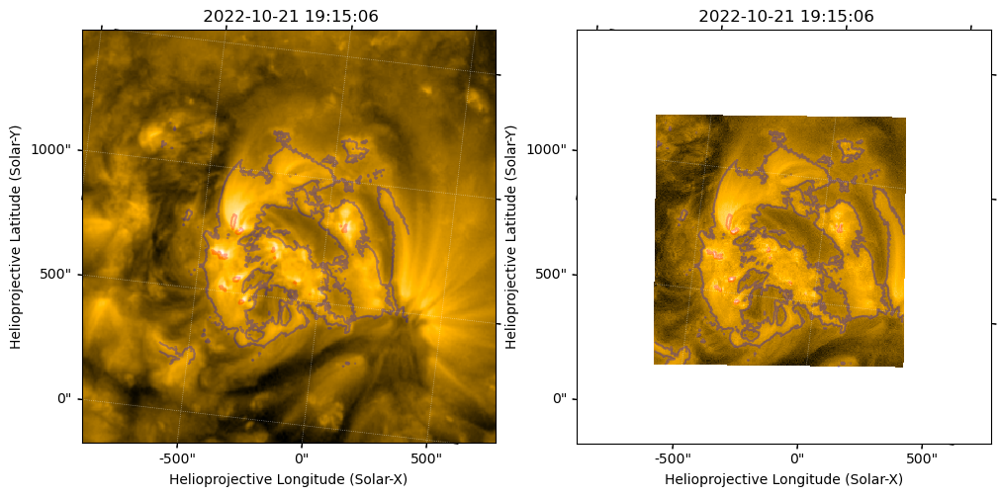

In [27]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=fsi_174_crop)
im1 = fsi_174_crop.plot()

ax2 = fig.add_subplot(122,projection=hri_174_map_repro)
im2 = hri_174_map_repro.plot()

hri_levels = [1000,5000]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    hri_174_map_repro.draw_contours(hri_levels,colors=["b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)


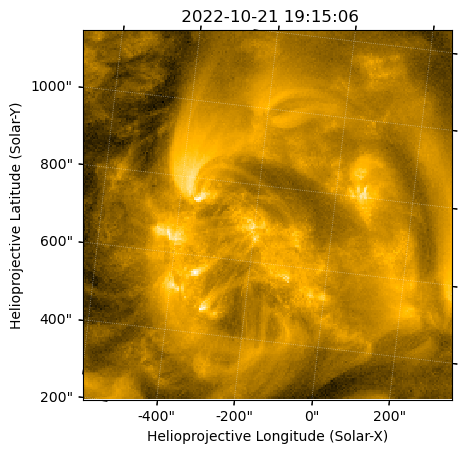

In [28]:
hri_174_map_repro_cut = hri_174_map_repro.submap([75,75]*u.pix,
                                                 top_right=[290,290]*u.pix)
hri_174_map_repro_cut.plot()

In [29]:
Txshift_hri, Tyshift_hri = coalign_shift(fsi_174_crop,hri_174_map_repro_cut)
print(Txshift_hri, Tyshift_hri)

7.45028 arcsec 7.35009 arcsec


In [30]:
hri_174_map_repro_shift = hri_174_map_repro.shift_reference_coord(Txshift_hri,Tyshift_hri)
hri_174_map_repro_cut_shift = hri_174_map_repro_cut.shift_reference_coord(Txshift_hri,Tyshift_hri)
hri_174_map_shifted = hri_174_map.shift_reference_coord(Txshift_hri,Tyshift_hri)
fsi_174_hri_fov = fsi_174_map_hri_time.reproject_to(hri_174_map_shifted.wcs)

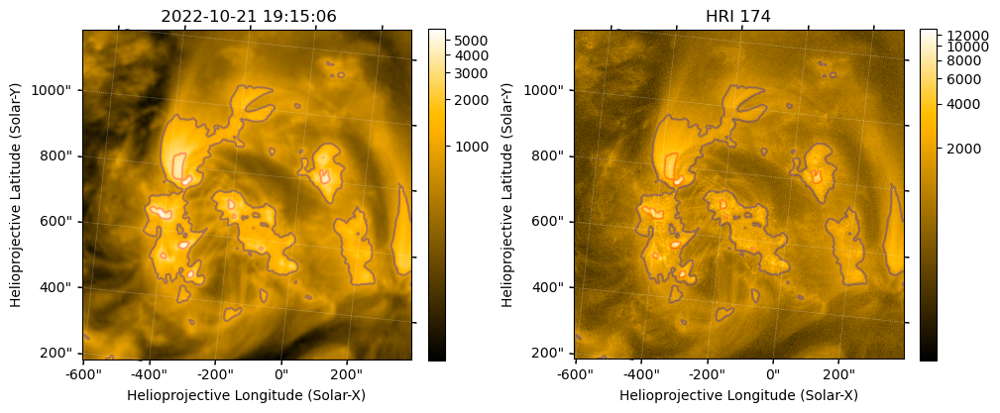

In [31]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=fsi_174_hri_fov)
im1 = fsi_174_hri_fov.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=hri_174_map_shifted)
im2 = hri_174_map_shifted.plot()
ax2.set_title("HRI 174")
plt.colorbar(ax=ax2,shrink=0.75)

fsi_174_levels = [1000,3000]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    fsi_174_hri_fov.draw_contours(fsi_174_levels,colors=["b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)

In [32]:
SunBlinker(fsi_174_hri_fov, hri_174_map_shifted,figsize=(5,5))

In [33]:
fsi_304_map_hri_time = derotate_fsi(fsi_304_map,hri_174_map)

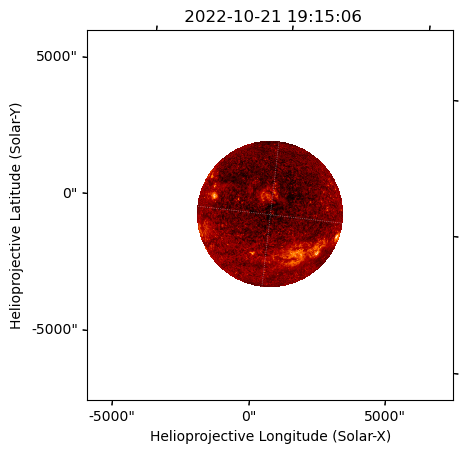

In [34]:
fsi_304_map_hri_time.plot()

In [35]:
fsi_304_crop = fsi_304_map_hri_time.submap(SkyCoord(-900*u.arcsec,0*u.arcsec,frame=fsi_304_map_hri_time.coordinate_frame),
                                    top_right=SkyCoord(600*u.arcsec,1500*u.arcsec,frame=fsi_304_map_hri_time.coordinate_frame))

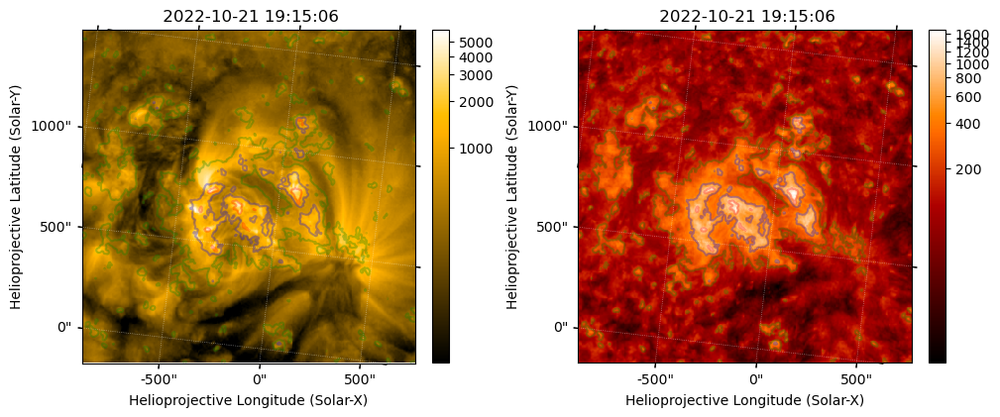

In [36]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=fsi_174_crop)
im1 = fsi_174_crop.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=fsi_304_crop)
im2 = fsi_304_crop.plot()
plt.colorbar(ax=ax2,shrink=0.75)

fsi_304_levels = [200,500,1000]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    fsi_304_crop.draw_contours(fsi_304_levels,colors=["g","b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)


In [37]:
SunBlinker(fsi_174_crop, fsi_304_crop)

In [38]:
aia_304_map_repro = aia_304_map.reproject_to(fsi_304_crop.wcs)

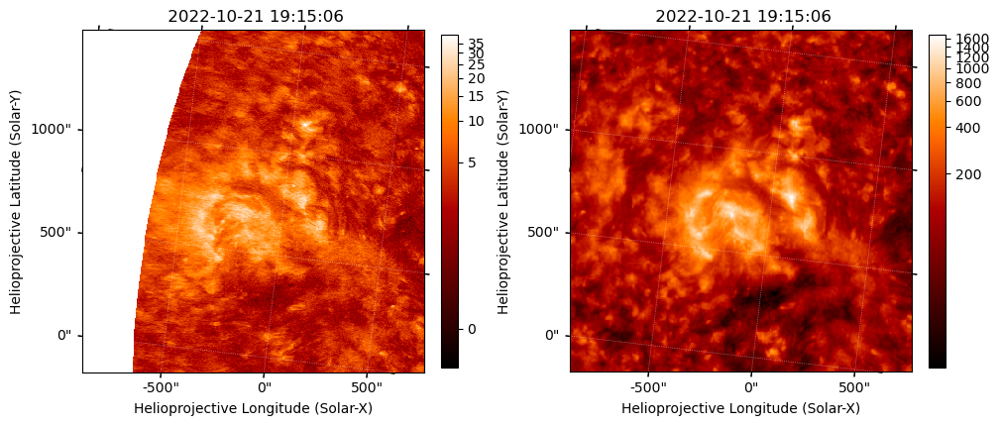

In [39]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_304_map_repro)
im1 = aia_304_map_repro.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=fsi_304_crop)
im2 = fsi_304_crop.plot()
plt.colorbar(ax=ax2,shrink=0.75)

# fsi_304_levels = [200,500,1000]

# for ax_ in (ax1,ax2):
#     bounds = ax_.axis()
#     fsi_304_crop.draw_contours(fsi_304_levels,colors=["g","b","r"], axes=ax_, alpha=0.3)
#     ax_.axis(bounds)


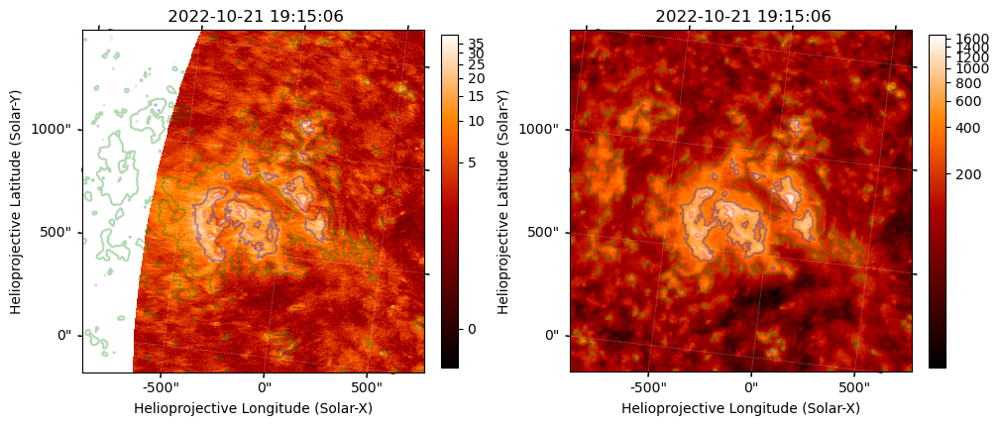

In [40]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_304_map_repro)
im1 = aia_304_map_repro.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=fsi_304_crop)
im2 = fsi_304_crop.plot()
plt.colorbar(ax=ax2,shrink=0.75)

fsi_304_levels = [200,500,1000]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    fsi_304_crop.draw_contours(fsi_304_levels,colors=["g","b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)


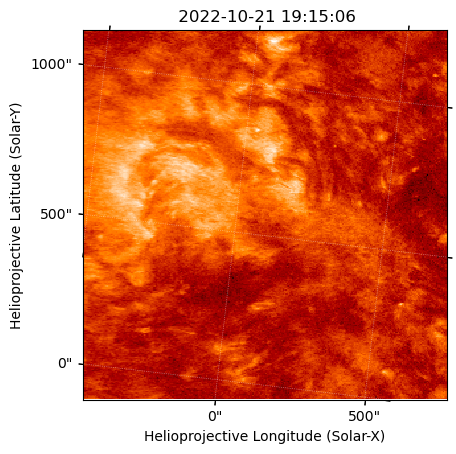

In [41]:
aia_304_map_repro_cut = aia_304_map_repro.submap([100,1]*u.pix,
                                                    top_right=[380,280]*u.pix)
aia_304_map_repro_cut.plot()

In [42]:
Txshift_aia_fsi, Tyshift_aia_fsi = coalign_shift(fsi_304_crop,aia_304_map_repro_cut)
print(Txshift_aia_fsi, Tyshift_aia_fsi)

-0.724434 arcsec 6.14017 arcsec


In [43]:
aia_304_map_repro_shift = aia_304_map_repro.shift_reference_coord(Txshift_aia_fsi,Tyshift_aia_fsi)
aia_304_map_repro_shift.plot_settings['norm'] = ImageNormalize(vmin=0, vmax=1000, stretch=AsinhStretch())

In [44]:
SunBlinker(aia_304_map_repro_shift, fsi_304_map_hri_time, reproject=True)

In [45]:
aia_1600_map_repro = aia_1600_map.reproject_to(fsi_304_crop.wcs)

In [46]:
aia_1600_map_repro_shift = aia_1600_map_repro.shift_reference_coord(Txshift_aia_fsi,Tyshift_aia_fsi)

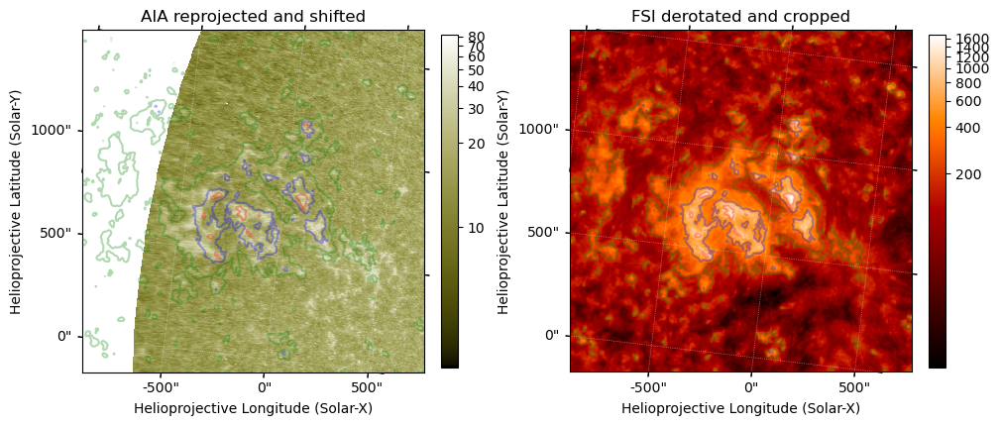

In [47]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_1600_map_repro_shift)
im1 = aia_1600_map_repro_shift.plot()
plt.colorbar(ax=ax1,shrink=0.75)
ax1.set_title("AIA reprojected and shifted")

ax2 = fig.add_subplot(122,projection=fsi_304_crop)
im2 = fsi_304_crop.plot()
plt.colorbar(ax=ax2,shrink=0.75)
ax2.set_title("FSI derotated and cropped")

fsi_304_levels = [200,500,1000]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    fsi_304_crop.draw_contours(fsi_304_levels,colors=["g","b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)


In [48]:
SunBlinker(aia_1600_map_repro_shift, fsi_304_crop)

In [49]:
aia_171_repro = aia_171_map.reproject_to(fsi_304_crop.wcs)
aia_171_repro_shift = aia_171_repro.shift_reference_coord(Txshift_aia_fsi,Tyshift_aia_fsi)

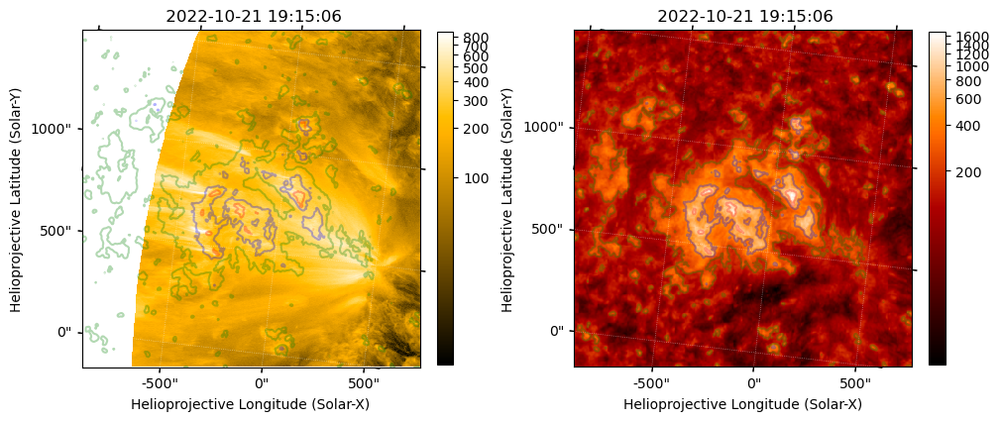

In [50]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_171_repro_shift)
im1 = aia_171_repro_shift.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=fsi_304_crop)
im2 = fsi_304_crop.plot()
plt.colorbar(ax=ax2,shrink=0.75)

fsi_304_levels = [200,500,1000]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    fsi_304_crop.draw_contours(fsi_304_levels,colors=["g","b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)

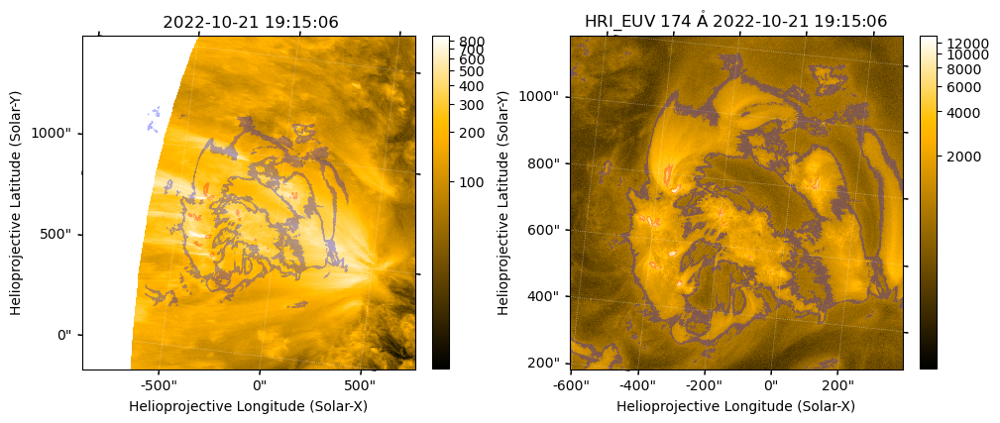

In [51]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_171_repro_shift)
im1 = aia_171_repro_shift.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=hri_174_map_shifted)
im2 = hri_174_map_shifted.plot()
plt.colorbar(ax=ax2,shrink=0.75)

hri_levels = [1000,5000]*hri_174_map_shifted.unit

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    hri_174_map_shifted.draw_contours(hri_levels,colors=["b","r"], axes=ax_, alpha=0.3,linewidths=0.5)
    ax_.axis(bounds)

In [52]:
aia_171_repro_shift_hrifov = aia_171_repro_shift.reproject_to(hri_174_map_shifted.wcs)

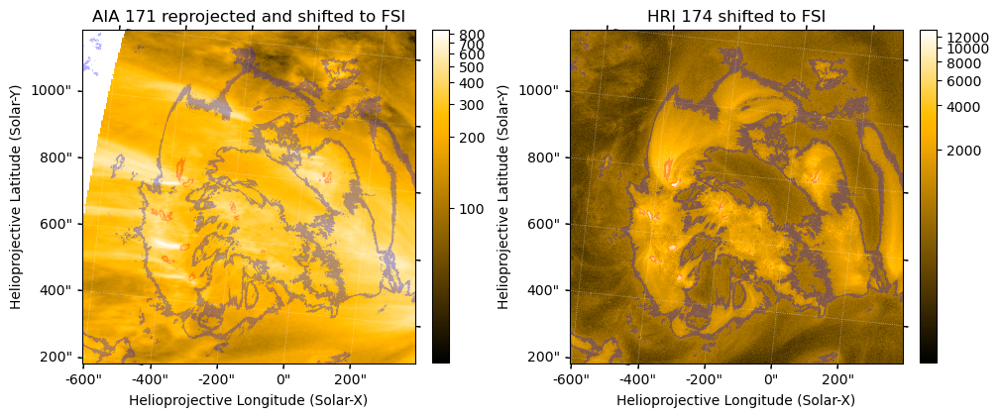

In [53]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_171_repro_shift_hrifov)
im1 = aia_171_repro_shift_hrifov.plot()
plt.colorbar(ax=ax1,shrink=0.75)
ax1.set_title("AIA 171 reprojected and shifted to FSI")

ax2 = fig.add_subplot(122,projection=hri_174_map_shifted)
im2 = hri_174_map_shifted.plot()
plt.colorbar(ax=ax2,shrink=0.75)
ax2.set_title("HRI 174 shifted to FSI")

hri_levels = [1000,5000]*hri_174_map_shifted.unit

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    hri_174_map_shifted.draw_contours(hri_levels,colors=["b","r"], axes=ax_, alpha=0.3,linewidths=0.5)
    ax_.axis(bounds)

In [54]:
SunBlinker(aia_171_repro_shift_hrifov, hri_174_map_shifted)

In [55]:
aia_193_repro = aia_193_map.reproject_to(fsi_304_crop.wcs)
aia_193_repro_shift = aia_193_repro.shift_reference_coord(Txshift_aia_fsi,Tyshift_aia_fsi)
aia_193_repro_shift_hrifov = aia_193_repro_shift.reproject_to(hri_174_map_shifted.wcs)

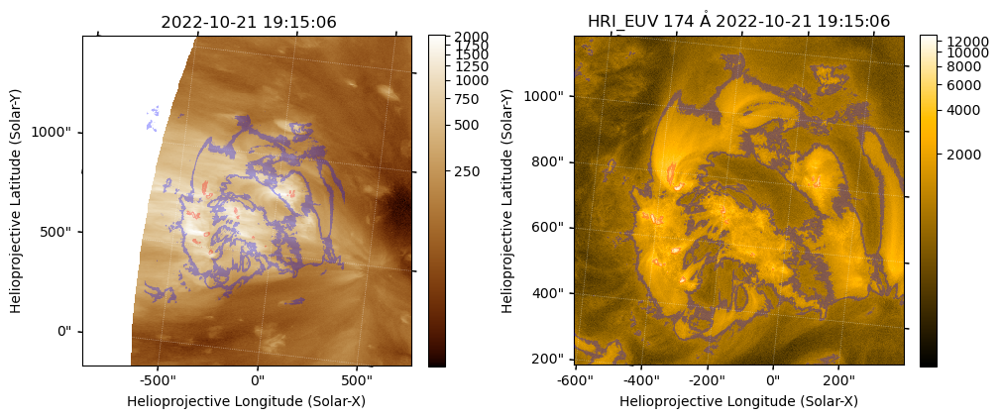

In [56]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_193_repro_shift)
im1 = aia_193_repro_shift.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=hri_174_map_shifted)
im2 = hri_174_map_shifted.plot()
plt.colorbar(ax=ax2,shrink=0.75)

hri_levels = [1000,5000]*hri_174_map_shifted.unit

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    hri_174_map_shifted.draw_contours(hri_levels,colors=["b","r"], axes=ax_, alpha=0.3,linewidths=0.5)
    ax_.axis(bounds)

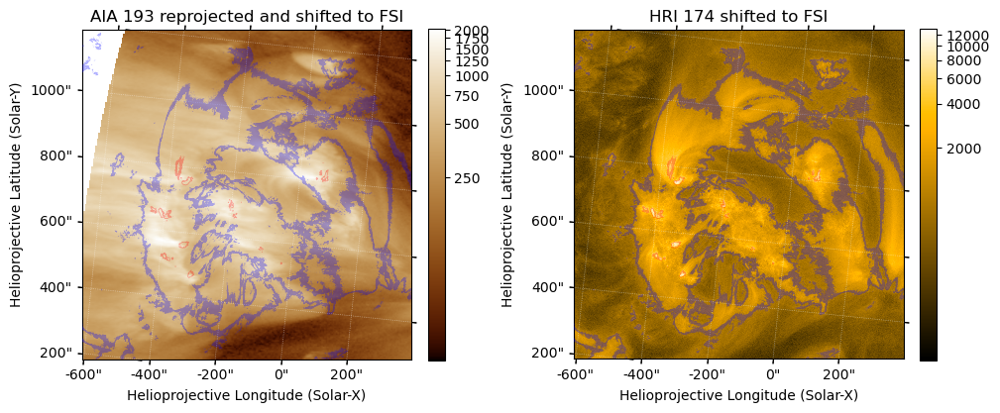

In [57]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_193_repro_shift_hrifov)
im1 = aia_193_repro_shift_hrifov.plot()
plt.colorbar(ax=ax1,shrink=0.75)
ax1.set_title("AIA 193 reprojected and shifted to FSI")

ax2 = fig.add_subplot(122,projection=hri_174_map_shifted)
im2 = hri_174_map_shifted.plot()
plt.colorbar(ax=ax2,shrink=0.75)
ax2.set_title("HRI 174 shifted to FSI")

hri_levels = [1000,5000]*hri_174_map_shifted.unit

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    hri_174_map_shifted.draw_contours(hri_levels,colors=["b","r"], axes=ax_, alpha=0.3,linewidths=0.5)
    ax_.axis(bounds)

In [58]:
SunBlinker(aia_193_repro_shift_hrifov, hri_174_map_shifted)

In [59]:
hmi_los_map_repro = hmi_los_map_to_aia.reproject_to(fsi_304_crop.wcs)
hmi_los_map_repro_shift = hmi_los_map_repro.shift_reference_coord(Txshift_aia_fsi,Tyshift_aia_fsi)
hmi_los_map_repro_shift_hrifov = hmi_los_map_repro_shift.reproject_to(hri_174_map_shifted.wcs)

In [60]:
fsi_304_crop_hrifov = fsi_304_crop.reproject_to(hri_174_map_shifted.wcs)

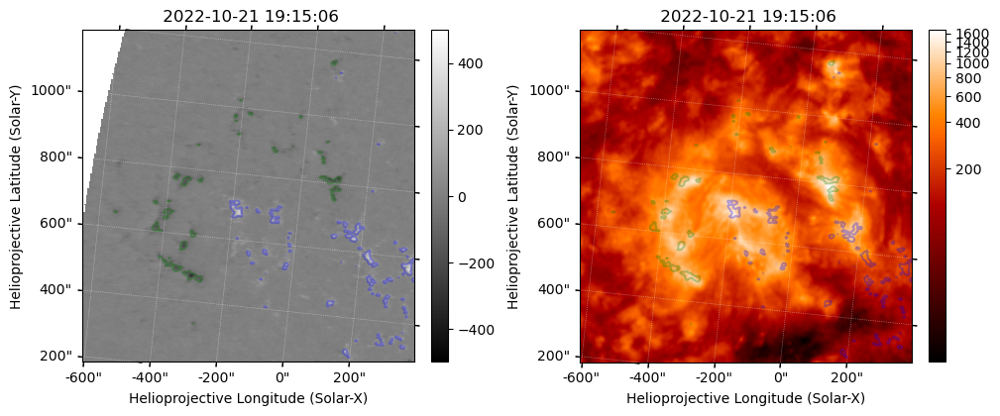

In [61]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=hmi_los_map_repro_shift_hrifov)
im1 = hmi_los_map_repro_shift_hrifov.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=fsi_304_crop_hrifov)
im2 = fsi_304_crop_hrifov.plot()
plt.colorbar(ax=ax2,shrink=0.75)

hmi_los_levels = [-100,100]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    hmi_los_map_repro_shift_hrifov.draw_contours(hmi_los_levels,colors=["g","b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)
    

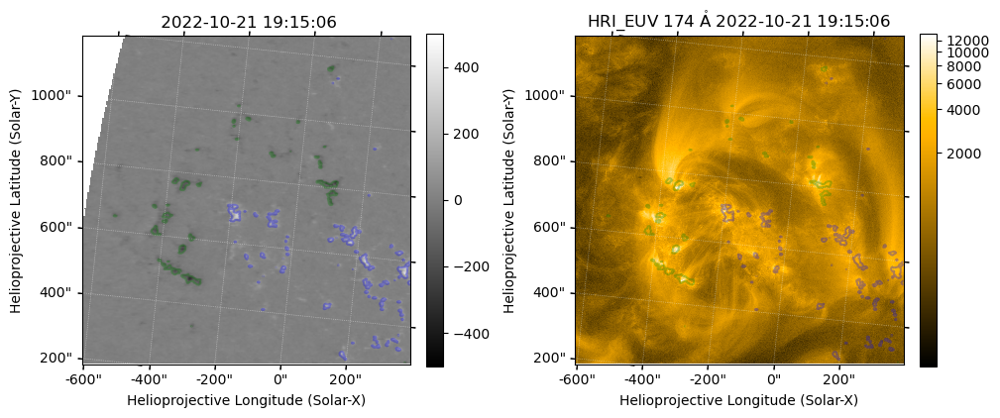

In [62]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=hmi_los_map_repro_shift_hrifov)
im1 = hmi_los_map_repro_shift_hrifov.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=hri_174_map_shifted)
im2 = hri_174_map_shifted.plot()
plt.colorbar(ax=ax2,shrink=0.75)

hmi_los_levels = [-100,100]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    hmi_los_map_repro_shift_hrifov.draw_contours(hmi_los_levels,colors=["g","b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)

In [63]:
SunBlinker(hmi_los_map_repro_shift_hrifov, hri_174_map_shifted)

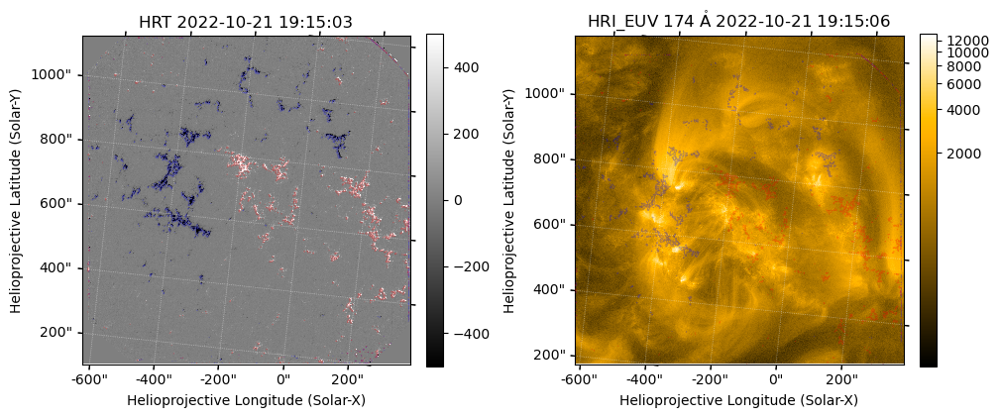

In [64]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=phi_los_map)
im1 = phi_los_map.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=hri_174_map)
im2 = hri_174_map.plot()
plt.colorbar(ax=ax2,shrink=0.75)

phi_levels = [-200,200]*phi_los_map.unit

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    phi_los_map.draw_contours(phi_levels,colors=["b","r"], axes=ax_, alpha=0.3,linewidths=0.5)
    ax_.axis(bounds)

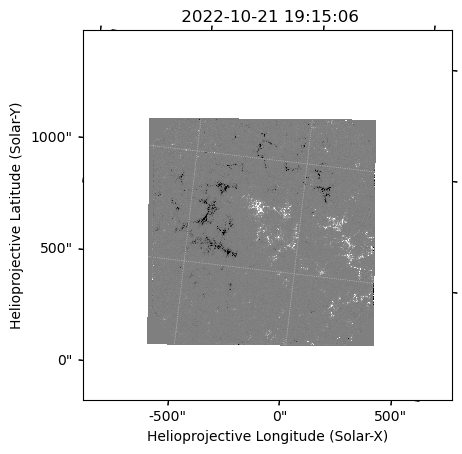

In [65]:
phi_los_map_resample = phi_los_map.reproject_to(fsi_304_crop.wcs)
phi_los_map_resample.plot()

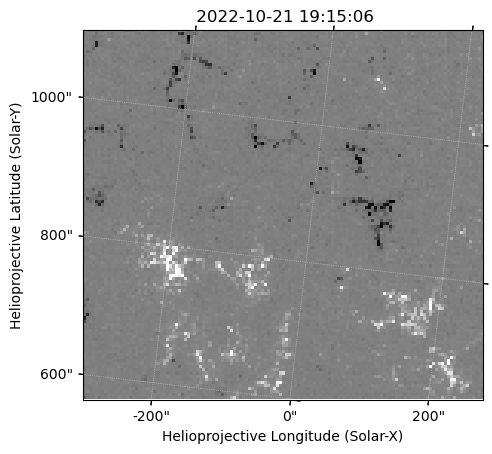

In [66]:
phi_los_map_resample_crop = phi_los_map_resample.submap([150,150]*u.pix,
                                                        top_right=[280,270]*u.pix)
phi_los_map_resample_crop.plot()

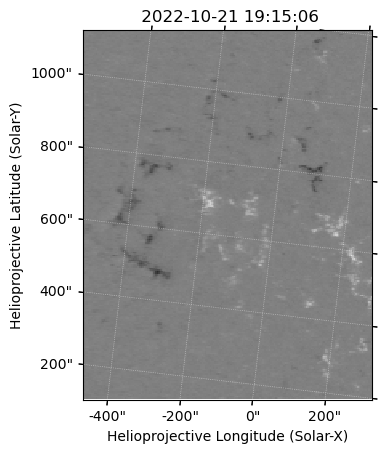

In [67]:
hmi_los_map_repro_shift_crop = hmi_los_map_repro_shift.submap([100,50]*u.pix,
                                                    top_right=[280,280]*u.pix)
hmi_los_map_repro_shift_crop.plot()

In [68]:
hmi_los_map_repro_shift_crop.data.shape

(231, 181)

In [69]:
Txshift_phi_hmi, Tyshift_phi_hmi = coalign_shift(hmi_los_map_repro_shift_crop,phi_los_map_resample_crop)
print(Txshift_phi_hmi, Tyshift_phi_hmi)

0.844595 arcsec -82.1448 arcsec


In [70]:
phi_los_map_shifted = phi_los_map.shift_reference_coord(Txshift_phi_hmi,Tyshift_phi_hmi)
phi_los_map_shifted_hrifov = phi_los_map_shifted.reproject_to(hri_174_map_shifted.wcs)
phi_los_map_resample_crop_shifted = phi_los_map_resample_crop.shift_reference_coord(Txshift_phi_hmi,Tyshift_phi_hmi)

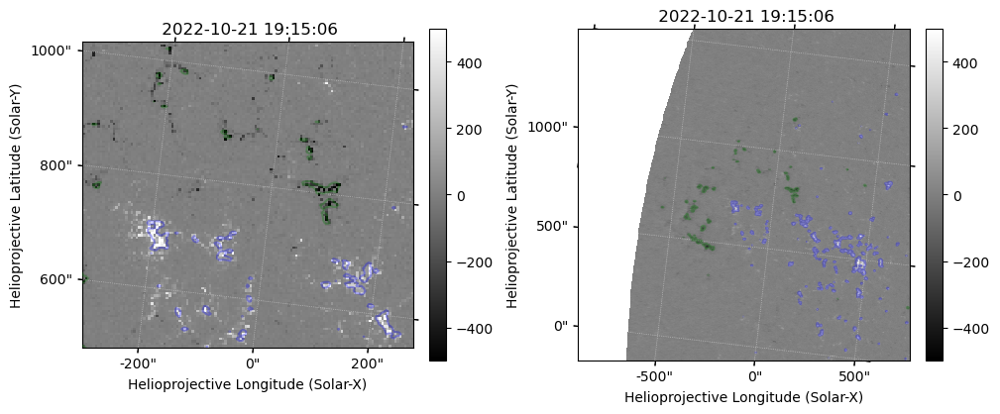

In [71]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=phi_los_map_resample_crop_shifted)
im1 = phi_los_map_resample_crop_shifted.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=hmi_los_map_repro_shift)
im2 = hmi_los_map_repro_shift.plot()
plt.colorbar(ax=ax2,shrink=0.75)

hmi_los_levels=[-100,100]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    hmi_los_map_repro_shift.draw_contours(hmi_los_levels,colors=["g","b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)

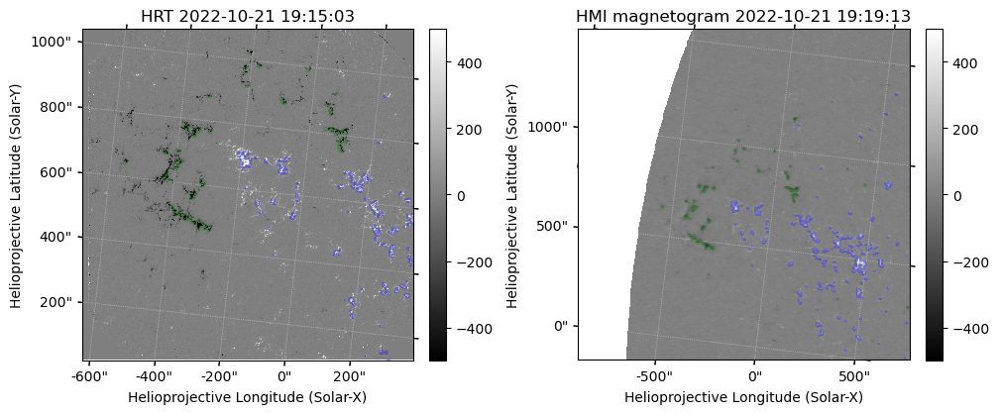

In [72]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=phi_los_map_shifted)
im1 = phi_los_map_shifted.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=hmi_los_map_repro_shift)
im2 = hmi_los_map_repro_shift.plot()
plt.colorbar(ax=ax2,shrink=0.75)
ax2.set_title(hmi_los_map.name)

hmi_los_levels=[-100,100]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    hmi_los_map_repro_shift.draw_contours(hmi_los_levels,colors=["g","b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)

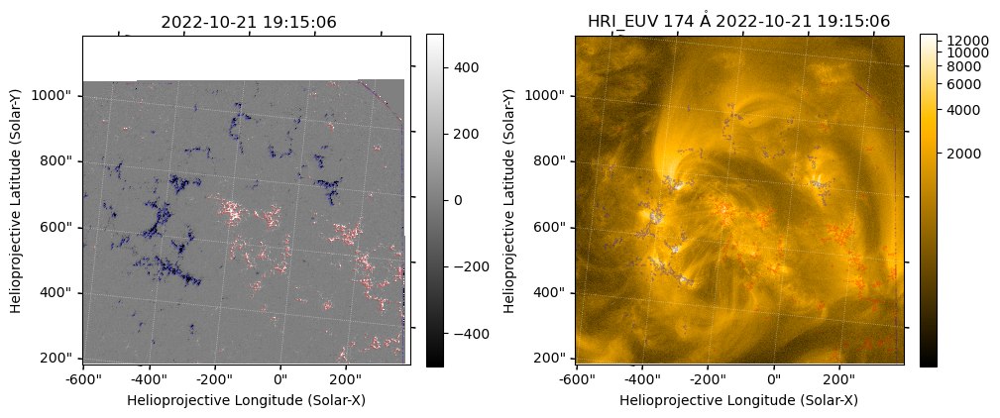

In [73]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=phi_los_map_shifted_hrifov)
im1 = phi_los_map_shifted_hrifov.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=hri_174_map_shifted)
im2 = hri_174_map_shifted.plot()
plt.colorbar(ax=ax2,shrink=0.75)

phi_levels = [-200,200]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    phi_los_map_shifted_hrifov.draw_contours(phi_levels,colors=["b","r"], axes=ax_, alpha=0.3,linewidths=0.5)
    ax_.axis(bounds)

In [74]:
SunBlinker(phi_los_map_shifted_hrifov, hmi_los_map_repro_shift_hrifov,figsize=(8,8))

In [75]:
dkist_vbi_430_mosaic_map = sunpy.map.Map("../../src/DKIST/vbi_mosaic/dkist_vbi_430_mosaic_map_new.fits")

In [76]:
aia_1700_map_coalign_crop = aia_1700_map_crop.submap(SkyCoord(-900*u.arcsec,150*u.arcsec,frame=aia_1700_map_crop.coordinate_frame),
                                        top_right=SkyCoord(-750*u.arcsec,300*u.arcsec,frame=aia_1700_map_crop.coordinate_frame))

aia_1600_map_coalign_crop = aia_1600_map_crop.submap(SkyCoord(-900*u.arcsec,150*u.arcsec,frame=aia_1600_map_crop.coordinate_frame),
                                        top_right=SkyCoord(-750*u.arcsec,300*u.arcsec,frame=aia_1600_map_crop.coordinate_frame))

hmi_ic_map_coalign_crop = hmi_ic_map_to_aia.submap(SkyCoord(-900*u.arcsec,150*u.arcsec,frame=hmi_ic_map_to_aia.coordinate_frame),
                                        top_right=SkyCoord(-750*u.arcsec,300*u.arcsec,frame=hmi_ic_map_to_aia.coordinate_frame))

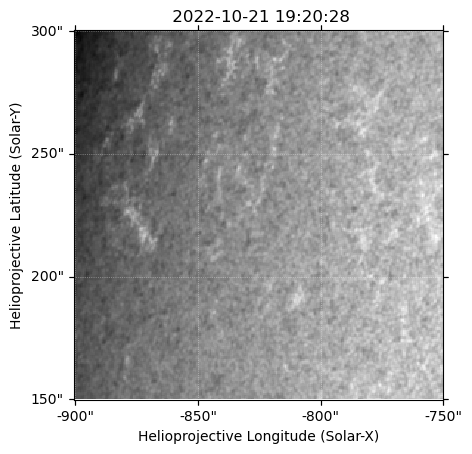

In [77]:
hmi_ic_map_coalign_crop.plot()

In [78]:
dkist_vbi_430_mosaic_map_resample_nx =  (dkist_vbi_430_mosaic_map.scale.axis1 * dkist_vbi_430_mosaic_map.dimensions.x) / hmi_ic_map_coalign_crop.scale.axis1
dkist_vbi_430_mosaic_map_resample_ny =  (dkist_vbi_430_mosaic_map.scale.axis2 * dkist_vbi_430_mosaic_map.dimensions.y) / hmi_ic_map_coalign_crop.scale.axis2
dkist_vbi_430_mosaic_map_resample = dkist_vbi_430_mosaic_map.resample((u.Quantity([dkist_vbi_430_mosaic_map_resample_nx,dkist_vbi_430_mosaic_map_resample_ny])))

In [79]:
dkist_vbi_430_mosaic_map_resample_repro = dkist_vbi_430_mosaic_map_resample.reproject_to(hmi_ic_map_coalign_crop.wcs)

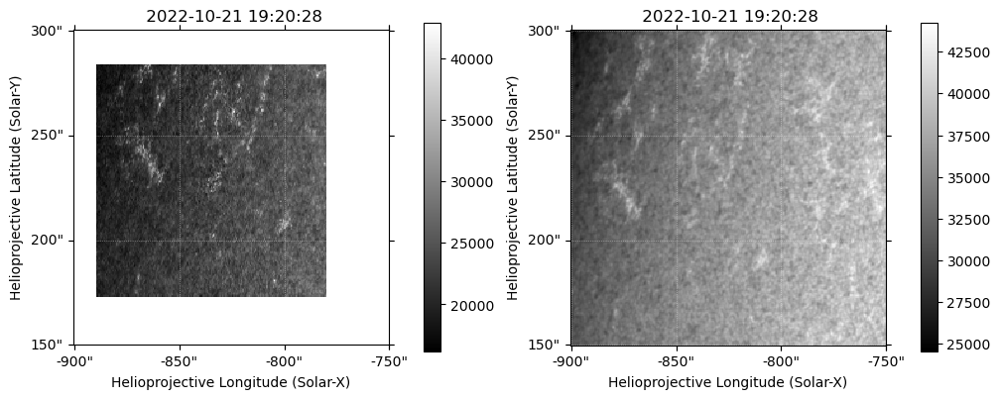

In [80]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=dkist_vbi_430_mosaic_map_resample_repro)
im1 = dkist_vbi_430_mosaic_map_resample_repro.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=hmi_ic_map_coalign_crop)
im2 = hmi_ic_map_coalign_crop.plot()
plt.colorbar(ax=ax2,shrink=0.75)

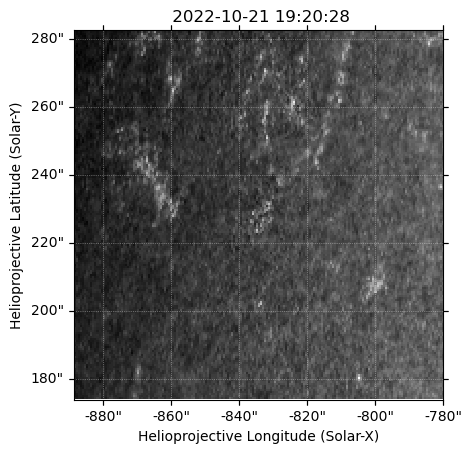

In [81]:
dkist_vbi_430_mosaic_map_resample_repro_crop = dkist_vbi_430_mosaic_map_resample_repro.submap([20,40]*u.pix,
                                                    top_right=[200,220]*u.pix)
dkist_vbi_430_mosaic_map_resample_repro_crop.plot()

In [82]:
Txshift_vbi_gband_hmi, Tyshift_vbi_gband_hmi = coalign_shift(hmi_ic_map_coalign_crop,dkist_vbi_430_mosaic_map_resample_repro_crop)
print(Txshift_vbi_gband_hmi, Tyshift_vbi_gband_hmi)

-9.34323 arcsec -16.9147 arcsec


In [83]:
dkist_vbi_430_mosaic_map_resample_repro_shift = dkist_vbi_430_mosaic_map_resample_repro.shift_reference_coord(Txshift_vbi_gband_hmi,Tyshift_vbi_gband_hmi)
dkist_vbi_430_mosaic_map_resample_repro_shift_repro = dkist_vbi_430_mosaic_map_resample_repro_shift.reproject_to(hmi_ic_map_coalign_crop.wcs)
dkist_vbi_430_mosaic_map_shift = dkist_vbi_430_mosaic_map.shift_reference_coord(Txshift_vbi_gband_hmi,Tyshift_vbi_gband_hmi)

In [84]:
SunBlinker(dkist_vbi_430_mosaic_map_resample_repro_shift_repro, hmi_ic_map_coalign_crop)